# EST 데이터셋 탐색적 데이터 분석 (리팩토링 버전)

이 노트북은 `est_utils.py`에 정의된 유틸리티 함수를 사용하여 데이터 분석 및 시각화 코드를 모듈화하고 재구성합니다.

## 1. 설정, 라이브러리 및 폰트 로딩

In [ ]:
# 공식 라이브러리
import os
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image, ImageDraw
import matplotlib.font_manager as fm

# 모듈
import est_utils as utils

#폰트
font_path = "/usr/share/fonts/truetype/nanum/NanumSquareB.ttf"
try:
    font_prop = fm.FontProperties(fname=font_path)
except FileNotFoundError:
    print(f"폰트를 찾을 수 없습니다: {font_path}. 한글이 깨질 수 있습니다.")
    font_prop = None

#완료 메세지 출력
print("Setup Complete.")

Setup Complete.


## 2. 데이터프레임 생성

In [2]:
master_df = utils.build_master_dataframe()
master_df.info()
master_df.head()

Building master dataframe... (This may take a while)
Processing 8394 unique images for metadata...


100%|██████████| 8394/8394 [00:08<00:00, 977.37it/s] 


Calculating bounding box statistics...
Master dataframe built successfully!
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25182 entries, 0 to 25181
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   split             25182 non-null  object 
 1   filename          25182 non-null  object 
 2   gender            25182 non-null  object 
 3   age               25182 non-null  int64  
 4   isProf            25182 non-null  object 
 5   uploader_faceExp  25182 non-null  object 
 6   uploader_bg       25182 non-null  object 
 7   annotator         25182 non-null  object 
 8   faceExp           25182 non-null  object 
 9   bg                25182 non-null  object 
 10  minX              25182 non-null  float64
 11  maxX              25182 non-null  float64
 12  minY              25182 non-null  float64
 13  maxY              25182 non-null  float64
 14  img_w             25182 non-null  int64  
 15  img_h      

,split,filename,gender,age,isProf,uploader_faceExp,uploader_bg,annotator,faceExp,bg,...,maxX,minY,maxY,img_w,img_h,bbox_w,bbox_h,bbox_area,bbox_aspect,bbox_rel_area
0,label_train,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_A,분노,교통/이동수단(엘리베이터 포함),...,2073.254605,539.506642,1486.204442,2944,2208,735.034500,946.697800,6.958555e+05,0.776419,0.107049
1,label_train,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_B,분노,교통/이동수단(엘리베이터 포함),...,2074.663605,528.132642,1490.044442,2944,2208,733.393500,961.911800,7.054599e+05,0.762433,0.108526
2,label_train,6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63...,남,30,일반인,분노,교통/이동수단(엘리베이터 포함),annot_C,분노,교통/이동수단(엘리베이터 포함),...,2072.188605,525.650642,1487.918442,2944,2208,732.103500,962.267800,7.044796e+05,0.760811,0.108376
3,label_train,65rsfe402042f34319e10128c1ab9614e2f967690a64a0...,남,40,전문인,분노,문화재 및 유적지,annot_A,분노,행사/사무공간,...,2889.526926,711.278453,2306.348256,4608,2592,1077.304110,1595.069804,1.718375e+06,0.675396,0.143870
4,label_train,65rsfe402042f34319e10128c1ab9614e2f967690a64a0...,남,40,전문인,분노,문화재 및 유적지,annot_B,분노,공공시설/종교/의료,...,2875.110464,688.002830,2311.339041,4608,2592,1058.197073,1623.336211,1.717810e+06,0.651866,0.143823


## 3. 분석 및 시각화 함수 정의

In [ ]:
def analyze_statistics(df):
    print("--- 기본 통계 분석 ---")
    print("[이미지 개수 분포 (Train/Val/Test)]")
    img_counts = df.drop_duplicates(subset=['split', 'filename']).groupby(['split', 'uploader_faceExp']).size().unstack(fill_value=0)
    print(img_counts)
    print("-"*50)
    person_df = df.drop_duplicates(subset=['filename'])[['gender', 'age', 'isProf']]
    print("[전체 성별 분포]")
    print(person_df['gender'].value_counts(dropna=False))
    print("[전체 연령대 분포]")
    print(person_df['age'].value_counts(dropna=False))
    print("-"*50)

def analyze_label_agreement(df, font_prop=None):
    print("--- 라벨 품질 분석 ---")
    agreement_rates = []
    for _, g in df.groupby('filename'):
        labels = g['faceExp'].dropna().tolist()
        if len(labels) < 3:
            continue
        vc = pd.Series(labels).value_counts()
        rate = vc.max() / len(labels)
        agreement_rates.append(rate)
    plt.figure(figsize=(8, 4))
    sns.histplot(agreement_rates, bins=5, kde=False)
    plt.title('3 Annotator Face Expression Agreement Rate')
    plt.show()
    print("-"*50)

def analyze_bbox_statistics(df, font_prop=None):
    print("--- 바운딩 박스 통계 분석 ---")
    bbox_df = df[['faceExp', 'bbox_w', 'bbox_h', 'bbox_aspect', 'bbox_rel_area']].copy()
    for col in ['bbox_w', 'bbox_h', 'bbox_aspect', 'bbox_rel_area']:
        plt.figure(figsize=(8, 4))
        sns.histplot(bbox_df[col].dropna(), bins=30, kde=True)
        plt.title(f'{col} distribution', fontproperties=font_prop)
        plt.show()
    plt.figure(figsize=(10, 5))
    ax = sns.boxplot(data=bbox_df, x='faceExp', y='bbox_rel_area')
    plt.title('Relative face box area by annotator faceExp', fontproperties=font_prop)
    if font_prop is not None:
        for label in ax.get_xticklabels():
            label.set_fontproperties(font_prop)
    plt.xticks(rotation=45)
    plt.show()
    print("-"*50)

def show_high_agreement_examples(df, emotion, font_prop=None, n=5):
    agreement_groups = df.groupby('filename').filter(lambda g: len(g['faceExp'].unique()) == 1 and len(g) == 3)
    target_files = agreement_groups[agreement_groups['uploader_faceExp'] == emotion]['filename'].unique()
    if len(target_files) == 0:
        print(f"'{emotion}' 감정에 대해 3명 모두 일치하는 이미지를 찾을 수 없습니다.")
        return
    sample_files = random.sample(list(target_files), min(n, len(target_files)))
    ncols = min(n, 5)
    nrows = (len(sample_files) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 4, nrows * 4))
    axes = np.ravel(axes)
    fig.suptitle(f"'{emotion}' 감정 3명 라벨 일치 예시 (Random {len(sample_files)} samples)", fontsize=16, fontproperties=font_prop)
    for i, filename in enumerate(sample_files):
        ax = axes[i]
        img_path = utils.find_image_path(filename)
        if img_path:
            print(f"Image Path: {img_path}")
            img = Image.open(img_path)
            img = utils.correct_image_orientation(img)
            ax.imshow(img)
            ax.set_title(filename[:15] + '...', fontsize=9)
        else:
            ax.set_title(f"Image not found", fontsize=9)
        ax.axis('off')
    for i in range(len(sample_files), len(axes)):
        axes[i].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def show_annotator_bboxes(df, emotion, font_prop=None, n=6):
    target_files = df[df['uploader_faceExp'] == emotion]['filename'].unique()
    if len(target_files) == 0:
        print(f"'{emotion}' 감정 이미지를 찾을 수 없습니다.")
        return
    sample_files = random.sample(list(target_files), min(n, len(target_files)))
    annot_colors = {'annot_A': 'red', 'annot_B': 'lime', 'annot_C': 'blue'}
    ncols = min(n, 3)
    nrows = (len(sample_files) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))
    axes = np.ravel(axes)
    fig.suptitle(f"'{emotion}' 감정 이미지에 대한 라벨러별 BBox 예시", fontsize=16, fontproperties=font_prop)
    for i, filename in enumerate(sample_files):
        ax = axes[i]
        img_path = utils.find_image_path(filename)
        if not img_path:
            ax.set_title('Image not found')
            ax.axis('off')
            continue
        print(f"Image Path: {img_path}")
        img = Image.open(img_path)
        img = utils.correct_image_orientation(img)
        draw = ImageDraw.Draw(img)
        records = df[df['filename'] == filename]
        for _, row in records.iterrows():
            bbox = (row['minX'], row['minY'], row['maxX'], row['maxY'])
            color = annot_colors.get(row['annotator'], 'white')
            if all(pd.notna(b) for b in bbox):
                draw.rectangle(bbox, outline=color, width=5)
        ax.imshow(img)
        ax.set_title(filename[:15] + '...', fontsize=9)
        ax.axis('off')
    for i in range(len(sample_files), len(axes)):
        axes[i].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def show_segmentation_examples(df, font_prop=None, n=6):
    sample_files = df['filename'].unique()
    sample_files = random.sample(list(sample_files), min(n, len(sample_files)))
    ncols = min(n, 3)
    nrows = (len(sample_files) + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 5, nrows * 5))
    axes = np.ravel(axes)
    fig.suptitle("세그멘테이션 마스크 시각화 예시", fontsize=16, fontproperties=font_prop)
    for i, filename in enumerate(sample_files):
        ax = axes[i]
        row = df[df['filename'] == filename].iloc[0]
        img_path = utils.find_image_path(filename)
        seg_split = row['split'].replace('label_', 'seg_')
        seg_path = utils.find_seg_path(filename, seg_split)
        if not img_path or not seg_path:
            ax.set_title('Image or Seg not found')
            ax.axis('off')
            continue
        print(f"Image Path: {img_path}")
        img = Image.open(img_path)
        img = utils.correct_image_orientation(img)
        seg_mask = utils.load_seg_mask(seg_path, filename)
        if seg_mask is not None:
            blended_img = utils.overlay_segmentation(img, seg_mask)
            ax.imshow(blended_img)
            ratios = utils.compute_seg_ratios(seg_mask)
            class_names = list(utils.SEG_CLASS_MAP.values())
            txt = ', '.join([f"{k}:{ratios[k]*100:.1f}%" for k in class_names if k in ratios and ratios[k] is not None])
            ax.set_title(f"{filename[:15]}...{txt}", fontsize=9)
        else:
            ax.imshow(img)
            ax.text(0.5, 0.5, 'Mask not found', ha='center', va='center', transform=ax.transAxes, color='red')
            ax.set_title(filename[:15] + '...', fontsize=9)
        ax.axis('off')
    for i in range(len(sample_files), len(axes)):
        axes[i].axis('off')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

def visualize_custom_image(image_path, seg_path=None, title=None, font_prop=None):
    if not os.path.exists(image_path):
        print(f"이미지 파일을 찾을 수 없습니다: {image_path}")
        return
    print(f"Image Path: {image_path}")
    img = Image.open(image_path)
    img = utils.correct_image_orientation(img)
    if seg_path:
        print("세그멘테이션 오버레이는 구현이 필요합니다.")
    plt.figure(figsize=(6, 6))
    plt.imshow(img)
    if title:
        plt.title(title, fontproperties=font_prop)
    plt.axis('off')
    plt.show()

## 4. 분석 실행

--- 기본 통계 분석 ---
[이미지 개수 분포 (Train/Val/Test)]
uploader_faceExp    기쁨    당황    분노    슬픔
split                                   
label_test         300   300   300   300
label_train       1494  1500  1500  1500
label_val          300   300   300   300
--------------------------------------------------
[전체 성별 분포]
gender
여    4558
남    3836
Name: count, dtype: int64
[전체 연령대 분포]
age
20    4208
30    2893
40     963
50     217
10      98
60      15
Name: count, dtype: int64
--------------------------------------------------
--- 라벨 품질 분석 ---


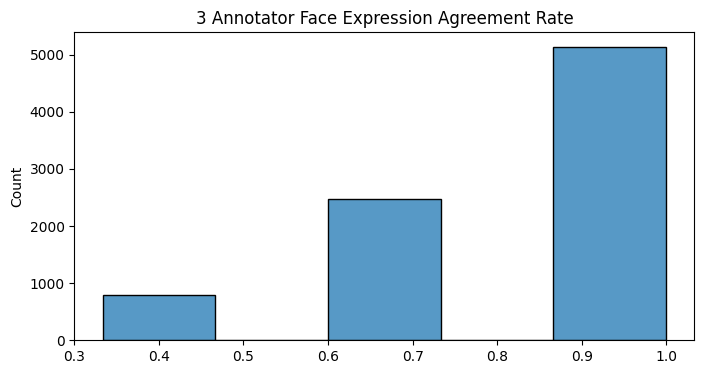

--------------------------------------------------
--- 바운딩 박스 통계 분석 ---


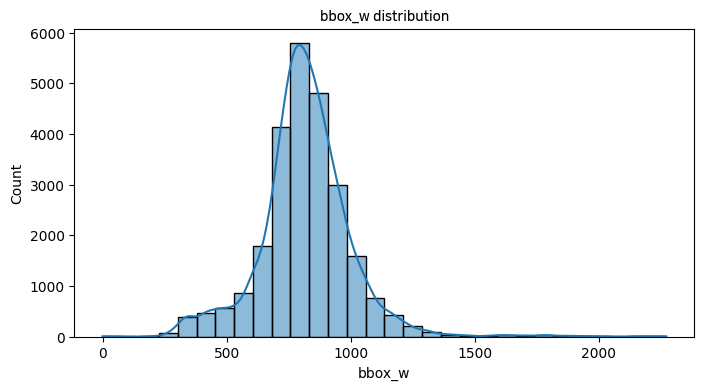

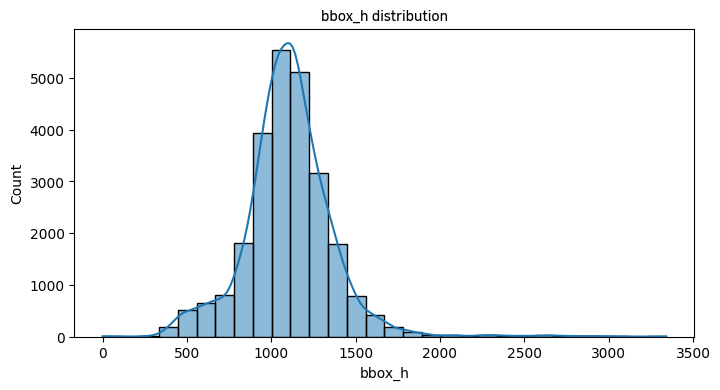

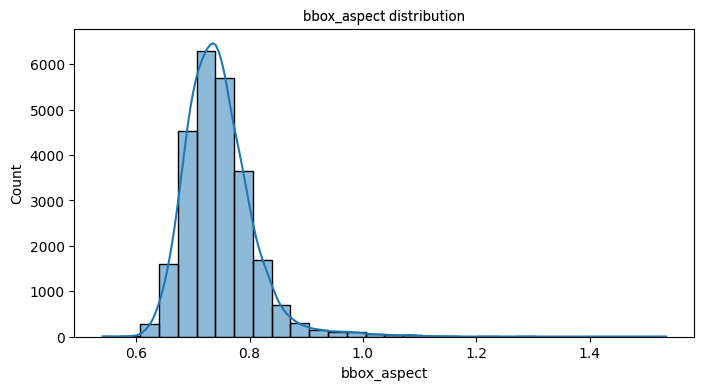

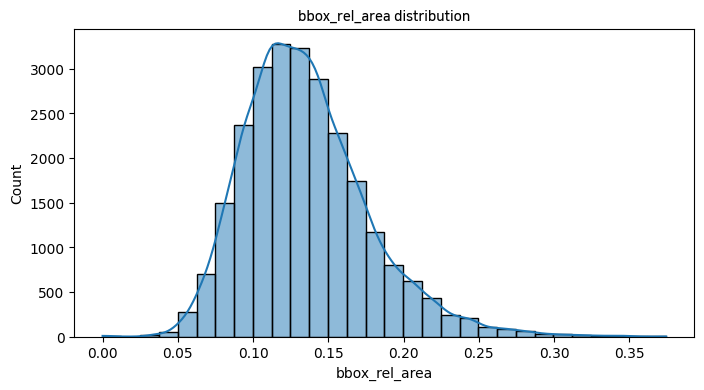

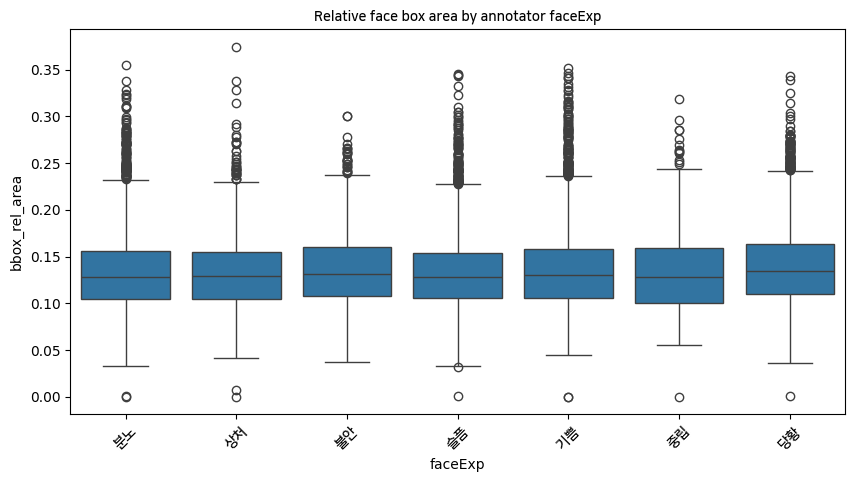

--------------------------------------------------


In [4]:
analyze_statistics(master_df)
analyze_label_agreement(master_df, font_prop=font_prop)
analyze_bbox_statistics(master_df, font_prop=font_prop)

## 5. 예시 이미지 시각화

Image Path: ./Data/EST_data/img_test/happy/y4l01aafa999155a335535c91bc7c9899fba5d891f85c093e085e64a9ebfdewwr.jpg
Image Path: ./Data/EST_data/img_train/happy/h9x489332d1a521a895e881c51ea1abf32e5618302313d0b1196a7523032cf3jy.jpg
Image Path: ./Data/EST_data/img_test/happy/wb341cf19c737d66c2c169cbe8018c76412611ec9c19cc69a28d134c5aa44wzw7.jpg
Image Path: ./Data/EST_data/img_train/happy/20or0b1fd853d191df12426472db95af75c2f0a75eb72451f592cb6ef481en2st.jpg
Image Path: ./Data/EST_data/img_test/happy/4wxia36962654224056261404a9ef92a6e9328ee0c9f6fee376f9a0338de62dwn.jpg


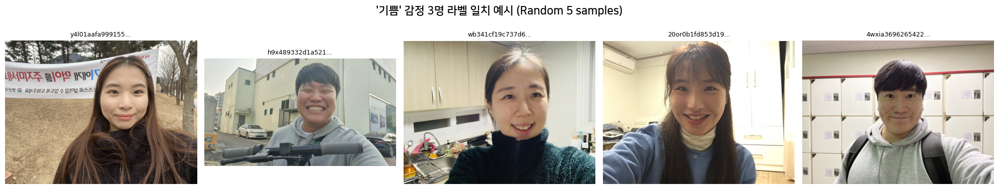

Image Path: ./Data/EST_data/img_train/anger/444sfb5cc32b00dfa737327a00dc6e29c39a7f0c572cc0c05a270be5eb7e5i5rh.jpg
Image Path: ./Data/EST_data/img_train/anger/jici82d2f8ceebff881fdf7080f0e771d28088cd17327019237117f3fe2d8r2m7.jpg
Image Path: ./Data/EST_data/img_train/anger/qwk107ac352a1506e6659e980ad26dd6719f66d61582bc73f5ce67fd6782c4w07.jpg
Image Path: ./Data/EST_data/img_train/anger/lqnb23401d2a09bf10904085392cd717978c8f778573c9f0a3ff3542e884e8se7.jpg
Image Path: ./Data/EST_data/img_train/anger/n69s894b29f7a991e779369326a6c7194cdc619c503adb60aa97aba3b23a63as1.jpg


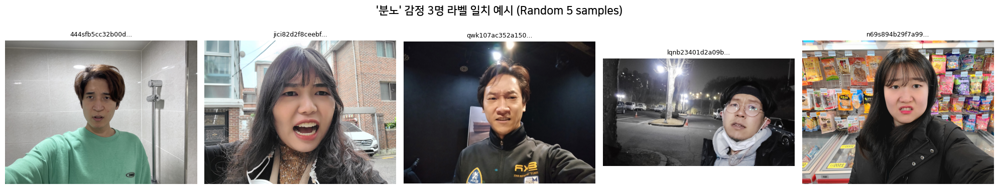

Image Path: ./Data/EST_data/img_train/panic/jnsja56f589929b591cd5885bcdc55df31b5a73dd8f8f0e5a1c145fd9f7c5ijvl.jpg
Image Path: ./Data/EST_data/img_train/panic/ex5k3c73fa8266d343c8dfd3f4ae8016f5eaf69ff040683cc171f003c3f11sndd.jpg
Image Path: ./Data/EST_data/img_train/panic/5bge59c57b7003b47b7a50bcf7d0cee5cba5e1b387047cc712ccbc74e315e56e7.jpg
Image Path: ./Data/EST_data/img_train/panic/m6lq87736e54531b6aa66861354c974a4284a8d4aadeac16993840e6d6fae217i.jpg
Image Path: ./Data/EST_data/img_val/panic/1otqf4dd13821728aa46d4bda3f44ec42268428e53e1ecc434aa6a22ef823j94e.jpg


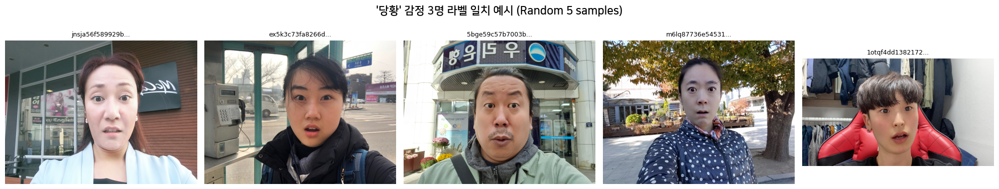

Image Path: ./Data/EST_data/img_train/sadness/obo3efe747b662786da4a0ae68e6826988d686960779978f4b77b7e636884busv.jpg
Image Path: ./Data/EST_data/img_train/sadness/y2r6917fb317624bb77f81a17ebf5cddba061d438d505dfa8f5533cd3a0b7tsho.jpg
Image Path: ./Data/EST_data/img_train/sadness/b1hnfa81317ec2d2aea1ee1a5a67d63edc8f2d929a9f870dd95e5881d6694erkv.jpg
Image Path: ./Data/EST_data/img_train/sadness/wjxsc6f19e57946c4dd0d025627752809e6924452e60c231abb5374d2135eu4z0.jpg
Image Path: ./Data/EST_data/img_train/sadness/b6mx331631569eb0cc3832da6d836d783fd26e6a85fec566dc13d6a25a271n4kh.jpg


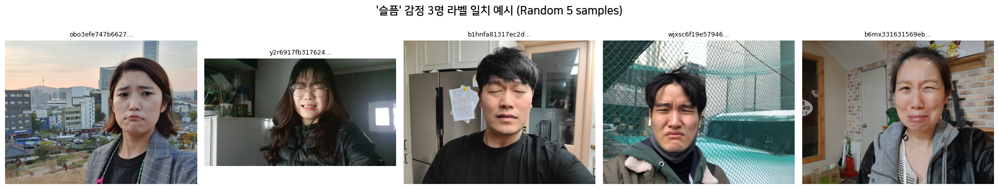

In [5]:
show_high_agreement_examples(master_df, emotion='기쁨', font_prop=font_prop, n=5)
show_high_agreement_examples(master_df, emotion='분노', font_prop=font_prop, n=5)
show_high_agreement_examples(master_df, emotion='당황', font_prop=font_prop, n=5)
show_high_agreement_examples(master_df, emotion='슬픔', font_prop=font_prop, n=5)

Image Path: ./Data/EST_data/img_test/happy/s9ks27616efefab7b56779a77c8ddffeac77f55e52bd75fdc5cafaef07258cgmg.jpg
Image Path: ./Data/EST_data/img_test/happy/vipye6d44e5d2039ceb3d0ed109f20d17e22ed497d52f20e263649afb79ebvgag.jpg
Image Path: ./Data/EST_data/img_test/happy/83exff19bdd5141023af11c5b7cfdda517dd66f659b1e5552d4ce6e9a743ak0ca.jpg


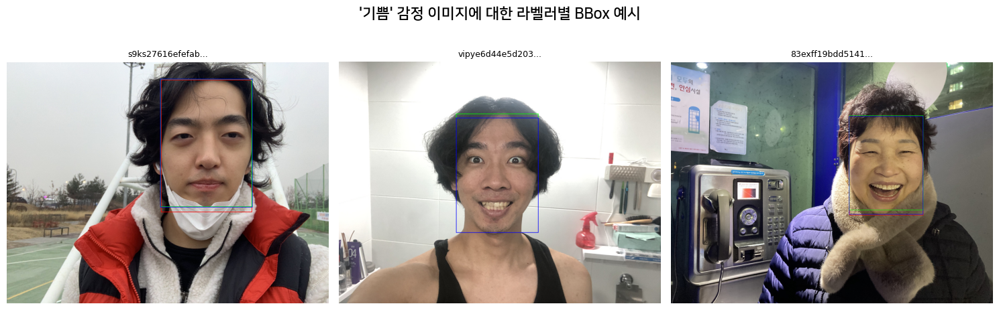

Image Path: ./Data/EST_data/img_train/anger/fl9m1a173273bc7000fb7bfa6f65326769afa1f3350222760497076caa03f6yls.jpg
Image Path: ./Data/EST_data/img_train/anger/kg0z3bddad9458c85c4b9334c48446a9438234b94422bfc5f54b55bcc4348ehr8.jpg
Image Path: ./Data/EST_data/img_val/anger/jtnic3b780943c975186b7a6e15fb2a252b7386d632477898ad525c6756dbh86d.jpg


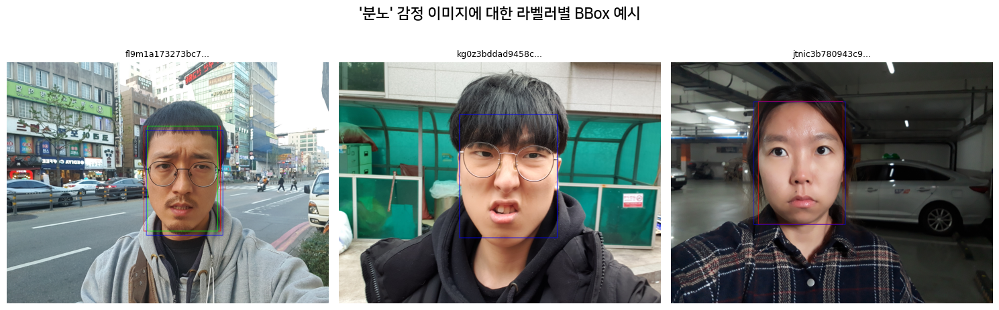

Image Path: ./Data/EST_data/img_train/panic/dek513032356876df6e12583b6b7b8b7bedbcf79358635862525309220358q02i.jpg
Image Path: ./Data/EST_data/img_val/panic/ksru63e269006013a58c7e6c650a6d080d56635410691a2663e56a07176c34lgb.jpg
Image Path: ./Data/EST_data/img_train/panic/ok3b8dfaa5b4cf330b020c68177aa0dee6e2fe467a6f442ea202c3a9c49f261rr.jpg


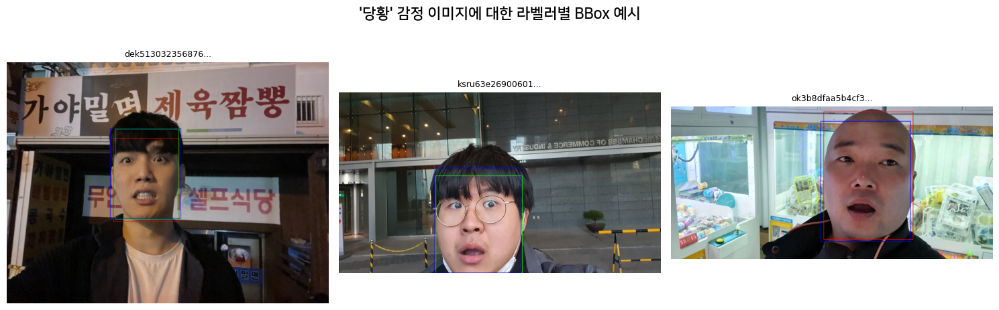

Image Path: ./Data/EST_data/img_train/sadness/knxm86156f6a3d082e2112a320d89843026331f5d306a888cafc04c8e8a04da1d.jpg
Image Path: ./Data/EST_data/img_val/sadness/6nhuff3d93dd5b3d90b8454f9c63d9259e64339912fdbff8e9ef8a4842f45re0w.jpg
Image Path: ./Data/EST_data/img_train/sadness/eqm265965cb0229892b2ab93b6381154b91d58859b299dba9585089344983f1pt.jpg


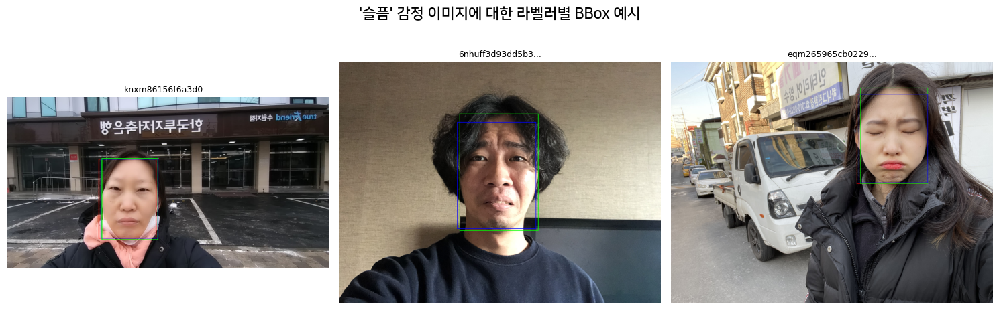

In [6]:
show_annotator_bboxes(master_df, emotion='기쁨', font_prop=font_prop, n=3)
show_annotator_bboxes(master_df, emotion='분노', font_prop=font_prop, n=3)
show_annotator_bboxes(master_df, emotion='당황', font_prop=font_prop, n=3)
show_annotator_bboxes(master_df, emotion='슬픔', font_prop=font_prop, n=3)

Image Path: ./Data/EST_data/img_train/panic/7gbj172e7fa4ea1b4426cb3d60c57c5aee5ddea500215c264c1cb417155e3x2d0.jpg
Image Path: ./Data/EST_data/img_test/panic/01h6ce85f03f4589312446c62372f5cb24ea3083e41d2b1f2ec95393e037fpv2i.jpg
Image Path: ./Data/EST_data/img_train/sadness/3a7s8f1749bf3a257df20510d827ff0c1a15ba8fbdabd2b52257a5175b520kbio.jpg
Image Path: ./Data/EST_data/img_train/sadness/jqww1f9f660b66b9efdf0fb5fef66a090f0006066b70a40280ebfe0ef1abb7j48.jpg
Image Path: ./Data/EST_data/img_train/happy/swuo745642a105c455cf523da98707f87c5db70b9dab359d725a470602b79q5iz.jpg


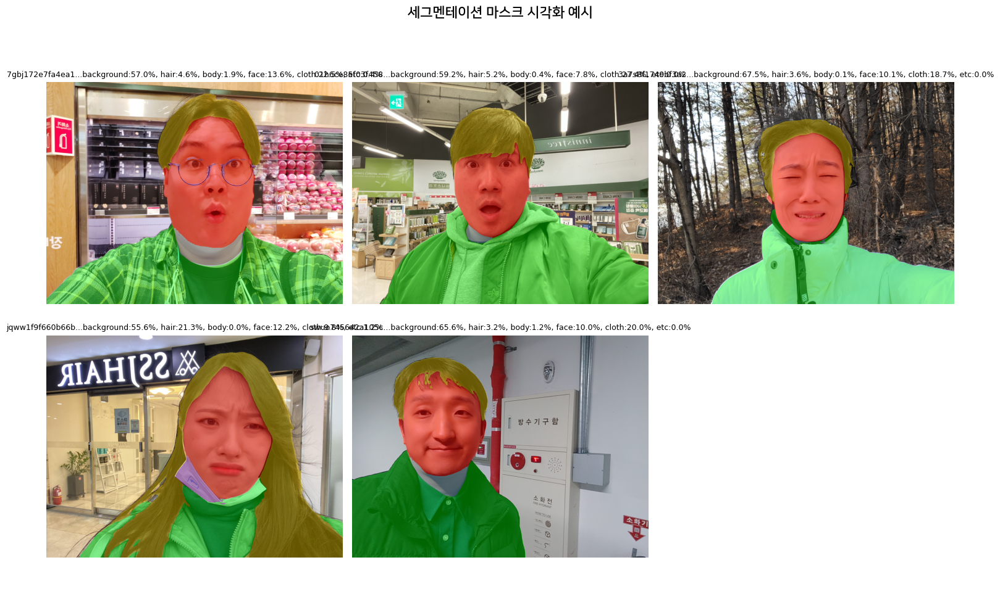

In [7]:
show_segmentation_examples(master_df, font_prop=font_prop, n=5)

## 6. 사용자 이미지 시각화 예시

Image Path: ./Data/EST_data/img_train/anger/6oj439e3fbcc52759fb3093035b7c0ecc55c93543dae63ec1162f5f6bfc6e481l.jpg


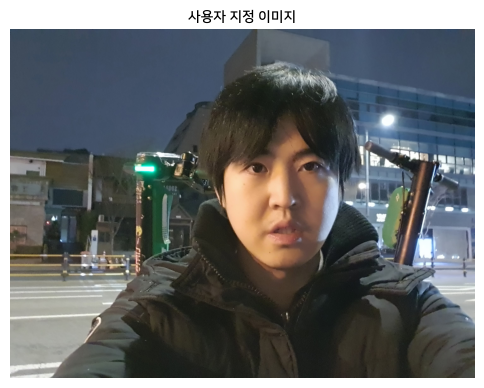

In [8]:
sample_img_path = utils.find_image_path(master_df[master_df['uploader_faceExp']=='분노']['filename'].iloc[0])
if sample_img_path:
    visualize_custom_image(sample_img_path, title='사용자 지정 이미지', font_prop=font_prop)